# **Image Super Resolution** 🌄🌠🎆

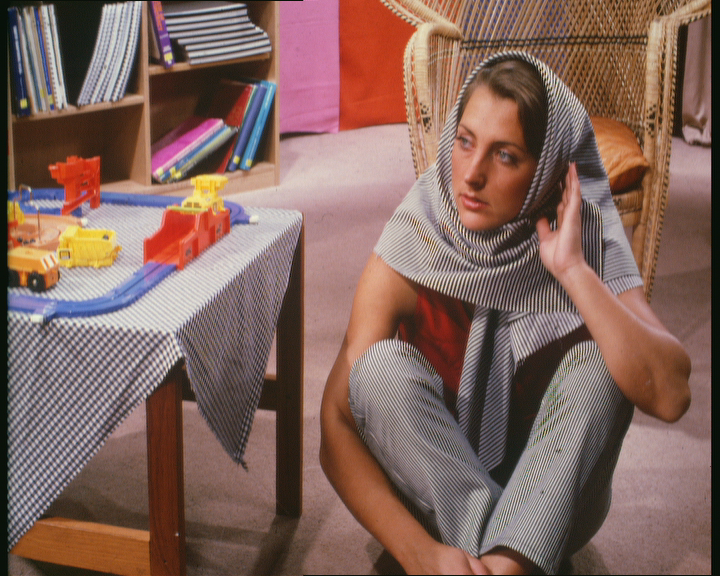

In [ ]:
#Load Libraries onto Colab

from google.colab import drive
from glob import glob
import random
import matplotlib.pyplot as plt
import pathlib
import matplotlib.image as mpimg
import cv2
import os
from PIL import Image
import numpy as np
import h5py
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import models

## Step 1: Load Data


In [ ]:
#Mount drive to Google Colab

drive.mount('/content/gdrive')

## Step 2: Visualize Data


In [ ]:
#Define training and test data path

training_dir='/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Train'

test_dir='/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Test/Set14'

#Define plotting function to plot random photos from dataset path

def plot_images(data_path):
  data_path=pathlib.Path(data_path)
  images=data_path.glob('*.bmp')
  images=list(images)
  r=random.sample(images,9)
  plt.figure(figsize=(15,10))
  for i in range(9):
    plt.subplot(int(f'33{i+1}'))
    img = mpimg.imread(r[i])
    plt.imshow(img)
plt.show()
  

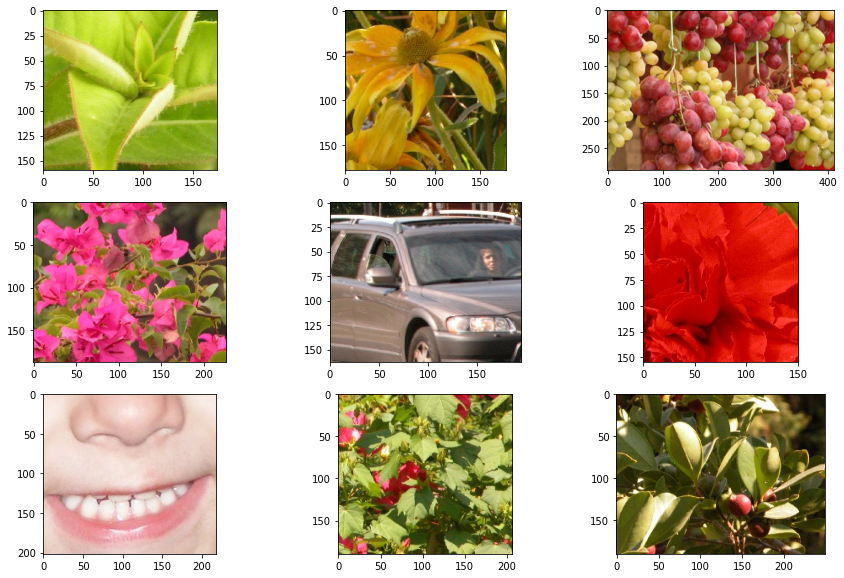

In [ ]:
#Random Images from Training Data

plot_images(training_dir)

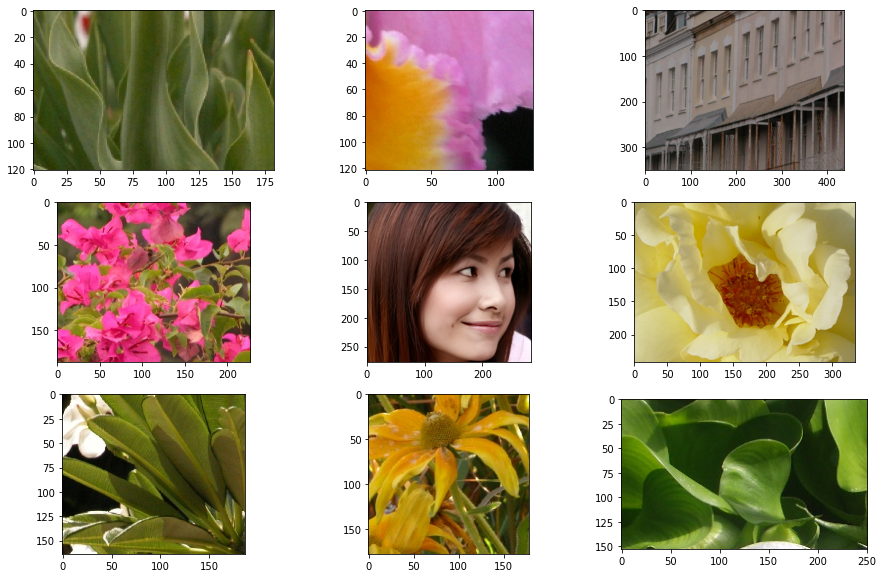

In [ ]:
#Random Images from Training Data

plot_images(training_dir)

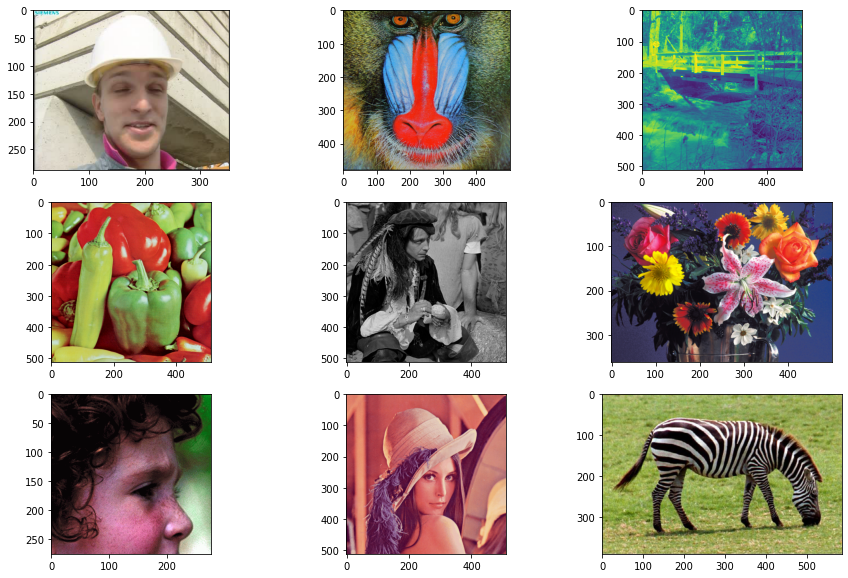

In [ ]:
#Random Images from Test Data

plot_images(test_dir)

In [ ]:
#Define function to distort images from raw data

def distort_images(path,scale):
  for i in os.listdir(path)[340:360]:
    image = cv2.imread(path + '/' + i)
    #Save each image's shape
    h,w,c = image.shape
    print(image.shape)
    #Scale down the image by the scale factor (pixel's information will be lost)
    new_height = int(h / scale)
    new_width = int(w / scale)
    downscaled_image = cv2.resize(image, (new_width, new_height), interpolation=cv2.INTER_CUBIC)
    print(downscaled_image.shape)
    #Resize the image back to original dimension (now with less pixel information)
    rescaled_image = cv2.resize(downscaled_image, (w, h), interpolation=cv2.INTER_CUBIC)    
    print(rescaled_image.shape)   
    # Save image
    try:
      os.listdir(path + '/../../resized')
    except:
      os.mkdir(path + '/../../resized')
              
    cv2.imwrite(path + '/../../resized/{}'.format(i), rescaled_image)   

In [ ]:
distort_images('/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset_Div2k/DIV2K_train_LR_bicubic/X4',2)

(360, 510, 3)
(180, 255, 3)
(360, 510, 3)
(339, 510, 3)
(169, 255, 3)
(339, 510, 3)
(300, 510, 3)
(150, 255, 3)
(300, 510, 3)
(339, 510, 3)
(169, 255, 3)
(339, 510, 3)
(510, 339, 3)
(255, 169, 3)
(510, 339, 3)
(339, 510, 3)
(169, 255, 3)
(339, 510, 3)
(510, 279, 3)
(255, 139, 3)
(510, 279, 3)
(450, 510, 3)
(225, 255, 3)
(450, 510, 3)
(315, 510, 3)
(157, 255, 3)
(315, 510, 3)
(348, 510, 3)
(174, 255, 3)
(348, 510, 3)
(222, 510, 3)
(111, 255, 3)
(222, 510, 3)
(339, 510, 3)
(169, 255, 3)
(339, 510, 3)
(384, 510, 3)
(192, 255, 3)
(384, 510, 3)
(339, 510, 3)
(169, 255, 3)
(339, 510, 3)
(318, 510, 3)
(159, 255, 3)
(318, 510, 3)
(339, 510, 3)
(169, 255, 3)
(339, 510, 3)
(339, 510, 3)
(169, 255, 3)
(339, 510, 3)
(294, 510, 3)
(147, 255, 3)
(294, 510, 3)
(339, 510, 3)
(169, 255, 3)
(339, 510, 3)
(366, 510, 3)
(183, 255, 3)
(366, 510, 3)


In [ ]:
#Visualize Original Image and Bicubic Interpolated Image

Original_Dir='/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Test/Set14'
Resized_Dir='/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/resized'

def compare_images(i):

    data_path=pathlib.Path(Original_Dir)
    images=data_path.glob('*.bmp')
    images=list(images)

    data_path_2=pathlib.Path(Resized_Dir)
    images2=data_path_2.glob('*.bmp')
    images2=list(images2)

    plt.figure(figsize=(15,10))

    plt.subplot(1,2,1)
    plt.title('Original Image')
    img = mpimg.imread(images[i])
    plt.imshow(img)

    plt.subplot(1,2,2)
    plt.title('Bicubic Interpolated Image')
    img2 = mpimg.imread(images2[i])
    plt.imshow(img2)

    plt.show()


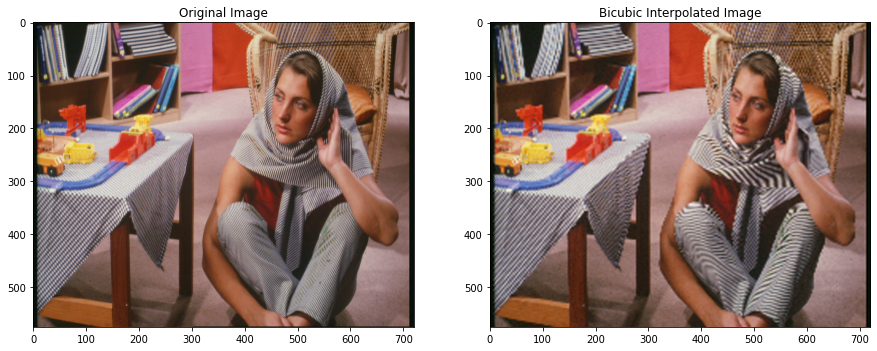

In [ ]:
compare_images(7)

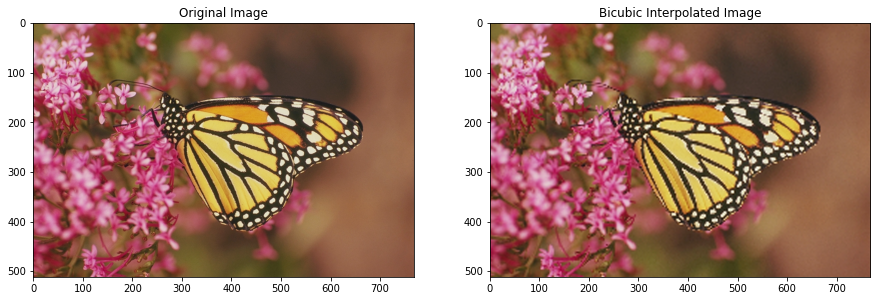

In [ ]:
compare_images(1)

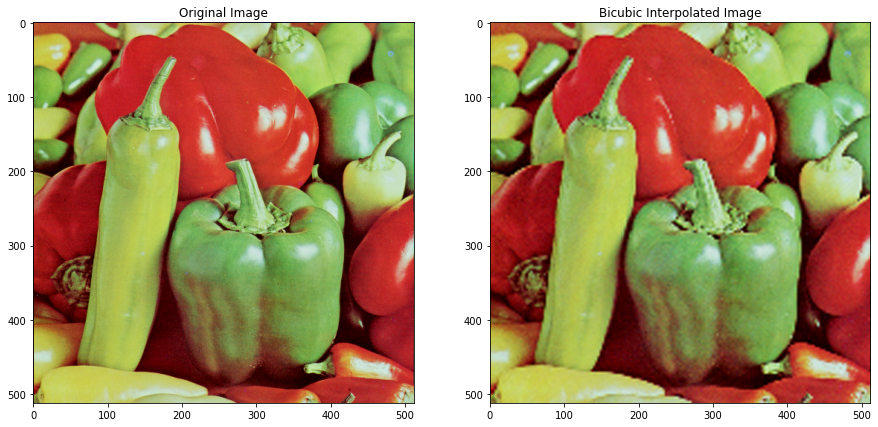

In [ ]:
compare_images(3)

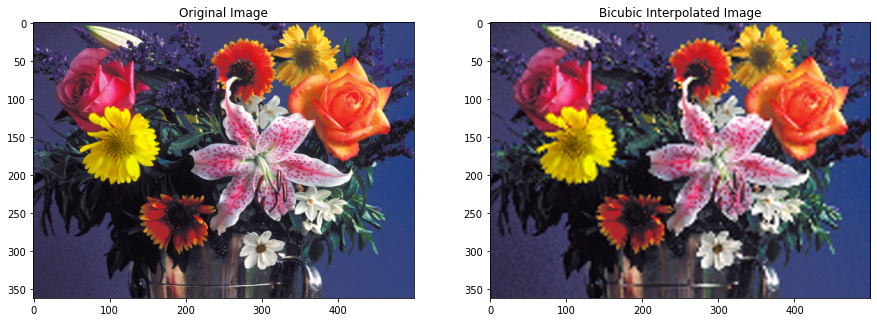

In [ ]:
compare_images(4)

## Define Loss Metrics


In [ ]:
#Peak Signal-to-Noise Ratio (PSNR)

def psnr(target,reference):
  target_data = target.astype(np.float32)
  ref_data = reference.astype(np.float32)
  diff = ref_data - target_data
  diff = diff.flatten('C')
  rmse = np.sqrt(np.mean(diff ** 2.))
  
  return 20 * np.log10(255. / rmse)


In [ ]:
#Mean Squared Error (MSE)

def mse(target,reference):
  target_data = target.astype(np.float32)
  ref_data = reference.astype(np.float32)
  err = np.sum((target_data - ref_data) ** 2)  
  err /= np.float(target_data.shape[0] * target_data.shape[1])

  return err

In [ ]:
#Structural Similarity (SSIM)

from skimage.metrics import structural_similarity as ssim

In [ ]:
#Append three metrics together

#Making a list incase I want to use it for evaluation in the future

def loss_metrics(target,reference):
  loss=[]
  loss.append(psnr(target,reference))
  loss.append(mse(target,reference))
  loss.append((ssim(target,reference,multichannel=True))) #multichannel=true because images have colors
  return loss 


In [ ]:
#Print out loss metrics

def print_loss(target,reference):
  loss=loss_metrics(target,reference)
  print(f'PNSR: {loss[0]}')
  print(f'MSE: {loss[1]}')
  print(f'SSIM: {loss[2]}')

### Testing Loss Metrics of Augmented Images

In [ ]:
Original_Dir='/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Test/Set14'
Resized_Dir='/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/resized'


data_path=pathlib.Path(Original_Dir)
images=data_path.glob('*.bmp')
images=list(images)

data_path_2=pathlib.Path(Resized_Dir)
images2=data_path_2.glob('*.bmp')
images2=list(images2)

target=cv2.imread(str(images[5]))
reference=cv2.imread(str(images2[5]))

print_loss(target,reference)



PNSR: 23.611040086002816
MSE: 849.3713699494949
SSIM: 0.5895746248348884


In [ ]:
Original_Dir='/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Test/Set14'
Resized_Dir='/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/resized'


data_path=pathlib.Path(Original_Dir)
images=data_path.glob('*.bmp')
images=list(images)

data_path_2=pathlib.Path(Resized_Dir)
images2=data_path_2.glob('*.bmp')
images2=list(images2)

target=cv2.imread(str(images[8]))
reference=cv2.imread(str(images2[8]))

print_loss(target,reference)


PNSR: 27.16285941665696
MSE: 374.9001736111111
SSIM: 0.8856551468701205


In [ ]:
Original_Dir='/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Test/Set14'
Resized_Dir='/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/resized'


data_path=pathlib.Path(Original_Dir)
images=data_path.glob('*.bmp')
images=list(images)

data_path_2=pathlib.Path(Resized_Dir)
images2=data_path_2.glob('*.bmp')
images2=list(images2)

target=cv2.imread(str(images[1]))
reference=cv2.imread(str(images2[1]))

print_loss(target,reference)



PNSR: 27.54266682281214
MSE: 343.5065104166667
SSIM: 0.9075299086701749


In [ ]:
Original_Dir='/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Test/Set14'
Resized_Dir='/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/resized'


data_path=pathlib.Path(Original_Dir)
images=data_path.glob('*.bmp')
images=list(images)

data_path_2=pathlib.Path(Resized_Dir)
images2=data_path_2.glob('*.bmp')
images2=list(images2)

target=cv2.imread(str(images[2]))
reference=cv2.imread(str(images2[2]))

print_loss(target,reference)


PNSR: 25.276414383454213
MSE: 578.8421741749081
SSIM: 0.816608907217752


## Prepare Training Dataset


In [ ]:
#Prepare Training Dataset

training_path='/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Train/'

pics=sorted(os.listdir(training_path))


In [ ]:
data=[]
label=[]

for pic in pics:
  path=str(training_path+pic)
  hr=cv2.imread(path,cv2.IMREAD_COLOR)
  #Convert to YCrCb
  hr=cv2.cvtColor(hr,cv2.COLOR_BGR2YCrCb)
  #Extract the luminance channel out
  hr=hr[:,:,0]
  shape=hr.shape

  #Produce lr image

  scale=2

  lr=cv2.resize(hr,(int(shape[1]/scale),int(shape[0]/scale)))
  lr=cv2.resize(lr,(shape[1],shape[0]))


  width_range = int((shape[0] - 16 * 2) / 16)
  height_range = int((shape[1] - 16 * 2) / 16)

  for k in range(width_range):
        for j in range(height_range):

            x = k * 16
            y = j * 16
            
            hr_patch = hr[x: x + 32, y: y + 32]

            lr_patch = lr[x: x + 32, y: y + 32]

            #normalize pixels
            
            hr_patch = hr_patch.astype(np.float32) / 255.

            lr_patch = lr_patch.astype(np.float32) / 255.
            
            hr1= np.zeros((1, 20, 20), dtype=np.double)
 
            lr1= np.zeros((1, 32, 32), dtype=np.double)
            
            #Padding of borders of 6

            hr1[0, :, :] = hr_patch[6:-6, 6: -6]
            lr1[0, :, :] = lr_patch
            
            label.append(hr1)
            data.append(lr1)

data = np.array(data, dtype=np.float32)
label = np.array(label, dtype=np.float32)


In [ ]:
#Export to H5PY File

with h5py.File('train.h5', 'w') as h:
    h.create_dataset('data', data=data, shape=data.shape)
    h.create_dataset('label', data=label, shape=label.shape)

with h5py.File('./train.h5', 'r') as h:
    data = np.array(h.get('data'))
    label = np.array(h.get('label'))
    X_train = np.transpose(data, (0, 2, 3, 1))
    y_train = np.transpose(label, (0, 2, 3, 1))

#Train Data Shape

print(X_train.shape)
print(y_train.shape)

(14901, 32, 32, 1)
(14901, 20, 20, 1)


##Prepare Testing Images

In [ ]:
#Prepare Testing Images

pics = sorted(os.listdir('/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Test/Set14'))
nums = len(pics)

#Crop 30 images from each picture

data_test = np.zeros((nums * 30, 1, 32, 32), dtype=np.double)
label_test = np.zeros((nums * 30, 1, 20, 20), dtype=np.double)

for i, pic in enumerate(pics):
    path = '/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Test/Set14/' + pic
    hrimg = cv2.imread(path, cv2.IMREAD_COLOR)
    hrimg = cv2.cvtColor(hrimg, cv2.COLOR_BGR2YCrCb)
    hrimg = hrimg[:, :, 0]
    shape = hrimg.shape
  
    # Bicubic interpolation

    lr_img = cv2.resize(hrimg, (int(shape[1] / 2), int(shape[0] / 2)))
    lr_img = cv2.resize(lr_img, (shape[1], shape[0]))
    
    # Produce random crop

    x = np.random.randint(0, min(shape[0], shape[1]) - 32, 30)
    y = np.random.randint(0, min(shape[0], shape[1]) - 32, 30)
    
    for j in range(30):
        lr_patch = lr_img[x[j]:x[j] + 32, y[j]:y[j] + 32]
        hr_patch = hrimg[x[j]:x[j] + 32, y[j]:y[j] + 32]
        
        lr_patch = lr_patch.astype(np.float32) / 255.
        hr_patch = hr_patch.astype(np.float32) / 255.
        
        data_test[i * 30 + j, 0, :, :] = lr_patch
        label_test[i * 30 + j, 0, :, :] = hr_patch[6: -6, 6: -6]

In [ ]:
#Export to H5PY File

with h5py.File('test.h5', 'w') as h:
    h.create_dataset('data', data=data_test, shape=data_test.shape)
    h.create_dataset('label', data=label_test, shape=label_test.shape)

with h5py.File('./test.h5', 'r') as h:
    data = np.array(h.get('data'))
    label = np.array(h.get('label'))
    X_test = np.transpose(data, (0, 2, 3, 1))
    y_test = np.transpose(label, (0, 2, 3, 1))

#Test data shape

print(X_test.shape)
print(y_test.shape)
    

(420, 32, 32, 1)
(420, 20, 20, 1)


##Define the SRCNN Model

In [ ]:
#SRCNN model based on research paper

def model():
    SRCNN = tf.keras.Sequential(name='SRCNN')
    SRCNN.add(tf.keras.layers.Conv2D(filters=128, kernel_size=(9, 9), 
                                     padding='VALID',
                                     use_bias=True,
                                     input_shape=(None, None, 1),
                                     kernel_initializer='glorot_uniform',
                                     activation='relu'))
    SRCNN.add(tf.keras.layers.Conv2D(filters=64, kernel_size=(3, 3),
                                     padding='SAME',
                                     use_bias=True,
                                     kernel_initializer='glorot_uniform',
                                     activation='relu'))
    SRCNN.add(tf.keras.layers.Conv2D(filters=1, kernel_size=(5, 5),
                                     padding='VALID',
                                     use_bias=True,
                                     kernel_initializer='glorot_uniform',
                                     activation='linear'))

    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0003)
  
    SRCNN.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mean_squared_error'])
    
    return SRCNN

In [ ]:
model = model()
model.summary()

Model: "SRCNN"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, None, None, 128)   10496     
_________________________________________________________________
conv2d_1 (Conv2D)            (None, None, None, 64)    73792     
_________________________________________________________________
conv2d_2 (Conv2D)            (None, None, None, 1)     1601      
Total params: 85,889
Trainable params: 85,889
Non-trainable params: 0
_________________________________________________________________


In [ ]:
#Make a file to save weights

RESULT='/content/gdrive/MyDrive/Final_Project_Super Resolution/Results'
INIT_WEIGHTS = os.path.join(RESULT, 'superresolution.h5')

## Start Training Model

In [ ]:
epoch=100

model.fit(X_train, y_train, batch_size=128, validation_data=(X_test, y_test), 
          shuffle=True,
          epochs=epoch, 
          verbose=2)

model.save(INIT_WEIGHTS)


Epoch 1/100
117/117 - 1s - loss: 8.9915e-04 - mean_squared_error: 8.9916e-04 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 2/100
117/117 - 0s - loss: 9.0088e-04 - mean_squared_error: 9.0088e-04 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 3/100
117/117 - 0s - loss: 8.9917e-04 - mean_squared_error: 8.9917e-04 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 4/100
117/117 - 0s - loss: 9.0045e-04 - mean_squared_error: 9.0045e-04 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 5/100
117/117 - 0s - loss: 9.0058e-04 - mean_squared_error: 9.0058e-04 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 6/100
117/117 - 0s - loss: 8.9401e-04 - mean_squared_error: 8.9401e-04 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 7/100
117/117 - 0s - loss: 8.9555e-04 - mean_squared_error: 8.9555e-04 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 8/100
117/117 - 0s - loss: 8.9561e-04 - mean_squared_error: 8.9561e-04 - val_loss: 0.0012 -

In [ ]:
INIT_WEIGHTS2 = os.path.join(RESULT, 'superresolution2.h5')
epoch=200

model.fit(X_train, y_train, batch_size=128, validation_data=(X_test, y_test), 
          shuffle=True,
          epochs=epoch, 
          verbose=2)

model.save(INIT_WEIGHTS2)

Epoch 1/200
117/117 - 1s - loss: 8.5794e-04 - mean_squared_error: 8.5794e-04 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 2/200
117/117 - 0s - loss: 8.5922e-04 - mean_squared_error: 8.5922e-04 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 3/200
117/117 - 0s - loss: 8.5672e-04 - mean_squared_error: 8.5672e-04 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 4/200
117/117 - 0s - loss: 8.5532e-04 - mean_squared_error: 8.5532e-04 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 5/200
117/117 - 0s - loss: 8.5688e-04 - mean_squared_error: 8.5688e-04 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 6/200
117/117 - 0s - loss: 8.5549e-04 - mean_squared_error: 8.5549e-04 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 7/200
117/117 - 0s - loss: 8.5686e-04 - mean_squared_error: 8.5686e-04 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 8/200
117/117 - 0s - loss: 8.6049e-04 - mean_squared_error: 8.6049e-04 - val_loss: 0.0013 -

In [ ]:
INIT_WEIGHTS3 = os.path.join(RESULT, 'superresolution3.h5')
epoch=500

model.fit(X_train, y_train, batch_size=128, validation_data=(X_test, y_test), 
          shuffle=True,
          epochs=epoch, 
          verbose=2)

model.save(INIT_WEIGHTS3)

Epoch 1/500
117/117 - 1s - loss: 8.1247e-04 - mean_squared_error: 8.1247e-04 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 2/500
117/117 - 0s - loss: 8.1671e-04 - mean_squared_error: 8.1671e-04 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 3/500
117/117 - 0s - loss: 8.1484e-04 - mean_squared_error: 8.1484e-04 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 4/500
117/117 - 0s - loss: 8.1169e-04 - mean_squared_error: 8.1169e-04 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 5/500
117/117 - 0s - loss: 8.1418e-04 - mean_squared_error: 8.1418e-04 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 6/500
117/117 - 0s - loss: 8.1566e-04 - mean_squared_error: 8.1566e-04 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 7/500
117/117 - 0s - loss: 8.1331e-04 - mean_squared_error: 8.1331e-04 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 8/500
117/117 - 0s - loss: 8.1146e-04 - mean_squared_error: 8.1146e-04 - val_loss: 0.0013 -

In [ ]:
model = keras.models.load_model('/content/gdrive/MyDrive/Final_Project_Super Resolution/Results/superresolution3.h5')

INIT_WEIGHTS4 = os.path.join(RESULT, 'superresolution4.h5')
epoch=2000

model.fit(X_train, y_train, batch_size=128, validation_data=(X_test, y_test), 
          shuffle=True,
          epochs=epoch, 
          verbose=2)

model.save(INIT_WEIGHTS4)

Epoch 1/2000
117/117 - 16s - loss: 7.6654e-04 - mean_squared_error: 7.6654e-04 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 2/2000
117/117 - 1s - loss: 7.6605e-04 - mean_squared_error: 7.6605e-04 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 3/2000
117/117 - 1s - loss: 7.6532e-04 - mean_squared_error: 7.6532e-04 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 4/2000
117/117 - 1s - loss: 7.6532e-04 - mean_squared_error: 7.6532e-04 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 5/2000
117/117 - 1s - loss: 7.6423e-04 - mean_squared_error: 7.6423e-04 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 6/2000
117/117 - 1s - loss: 7.6433e-04 - mean_squared_error: 7.6433e-04 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 7/2000
117/117 - 1s - loss: 7.6772e-04 - mean_squared_error: 7.6772e-04 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 8/2000
117/117 - 1s - loss: 7.6556e-04 - mean_squared_error: 7.6556e-04 - val_loss:

##Testing Predictions

In [ ]:
model = keras.models.load_model('/content/gdrive/MyDrive/Final_Project_Super Resolution/Results/superresolutionxx42.h5')

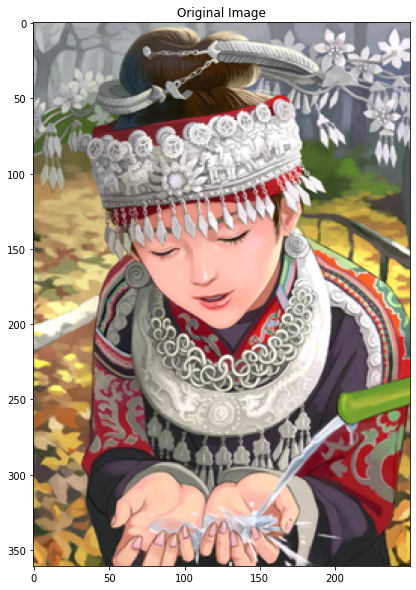

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
ax.imshow(Image.open('/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Test/Set14/comic.bmp'))
ax.title.set_text("Original Image")
plt.show()

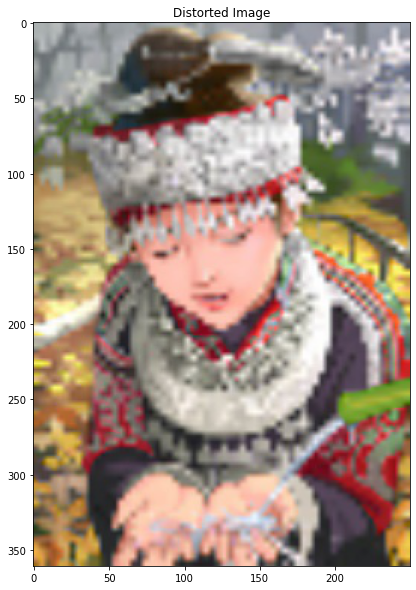

In [ ]:
target = cv2.imread('/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Test/Set14/comic.bmp', cv2.IMREAD_COLOR)
target = cv2.cvtColor(target, cv2.COLOR_BGR2YCrCb)
shape = target.shape

# Resize down by scale of 2
Y_img = cv2.resize(target[:, :, 0], (int(shape[1] / 4), int(shape[0] / 4)), cv2.INTER_CUBIC)

# Resize up to orignal image
Y_img = cv2.resize(Y_img, (shape[1], shape[0]), cv2.INTER_CUBIC)
target[:, :, 0] = Y_img
target = cv2.cvtColor(target, cv2.COLOR_YCrCb2BGR)
cv2.imwrite('/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Output/test1.jpg', target)

fig, ax = plt.subplots(figsize=(15, 10))
ax.imshow(Image.open('/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Output/test1.jpg'))
ax.title.set_text("Distorted Image")
plt.show()

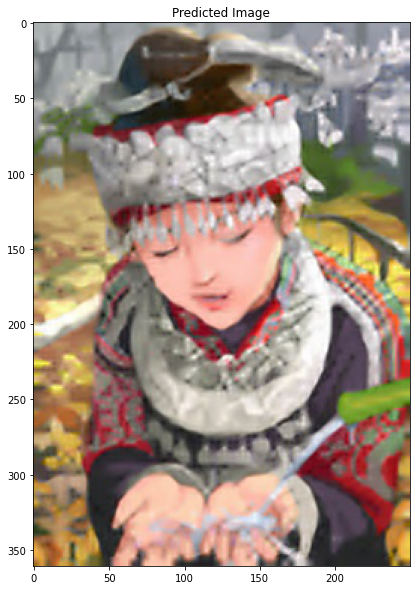

In [ ]:
Y = np.zeros((1, target.shape[0], target.shape[1], 1), dtype=np.float32)
# Normalize
Y[0, :, :, 0] = Y_img.astype(np.float32) / 255.

# Predict
pre = model.predict(Y, batch_size=1) * 255.

# Post process output
pre[pre[:] > 255] = 255
pre[pre[:] < 0] = 0
pre = pre.astype(np.uint8)

# Copy y channel back to image and convert to BGR
output = cv2.cvtColor(target, cv2.COLOR_BGR2YCrCb)
output[6: -6, 6: -6, 0] = pre[0, :, :, 0]
output = cv2.cvtColor(output, cv2.COLOR_YCrCb2BGR)

# Save image
cv2.imwrite('/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Output/test3.jpg', output)

fig, ax = plt.subplots(figsize=(15, 10))
ax.imshow(Image.open('/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Output/test3.jpg'))
ax.title.set_text("Predicted Image")
plt.show()

In [ ]:
reference=cv2.imread('/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Test/Set14/comic.bmp')
target=cv2.imread('/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Output/test1.jpg')

print_loss(target,reference)

PNSR: 19.649832216318973
MSE: 2114.552199445983
SSIM: 0.5986066443358589


In [ ]:
reference=cv2.imread('/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Test/Set14/comic.bmp')
target=cv2.imread('/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Output/test3.jpg')

print_loss(target,reference)

PNSR: 19.940456091857776
MSE: 1977.6801329639889
SSIM: 0.6259409902012413


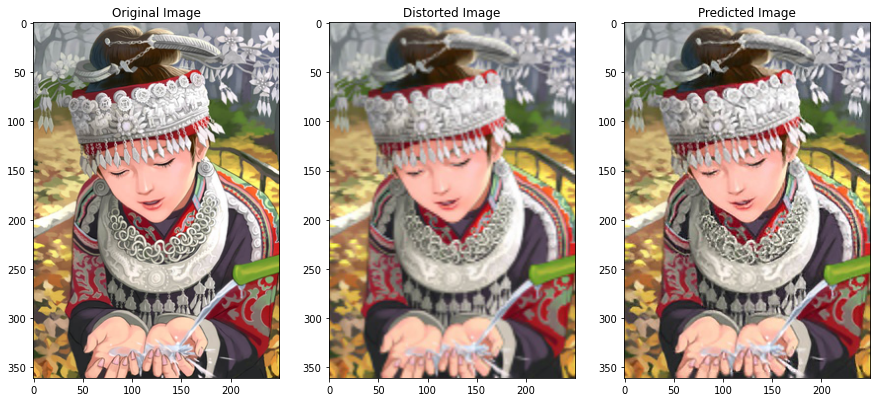

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(15, 10))
ax[0].imshow(Image.open('/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Test/Set14/comic.bmp'))
ax[0].title.set_text("Original Image")

ax[1].imshow(Image.open('/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Output/test1.jpg'))
ax[1].title.set_text("Distorted Image")

ax[2].imshow(Image.open('/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Output/test3.jpg'))
ax[2].title.set_text("Predicted Image")

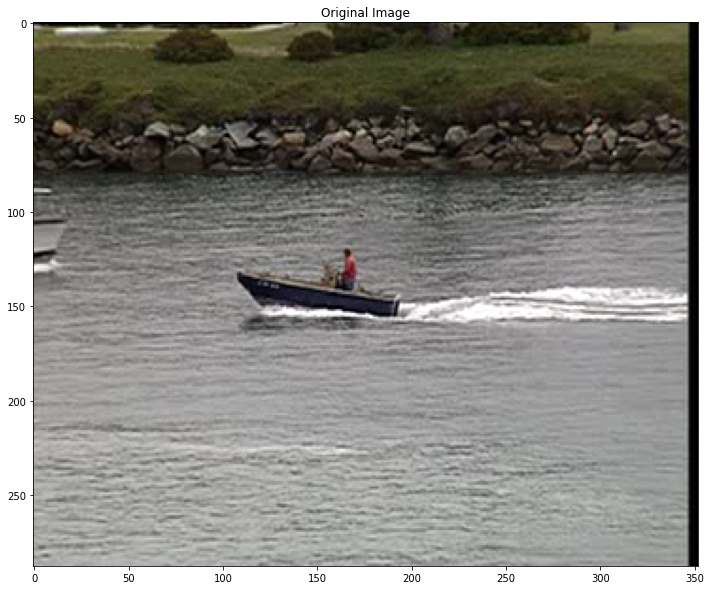

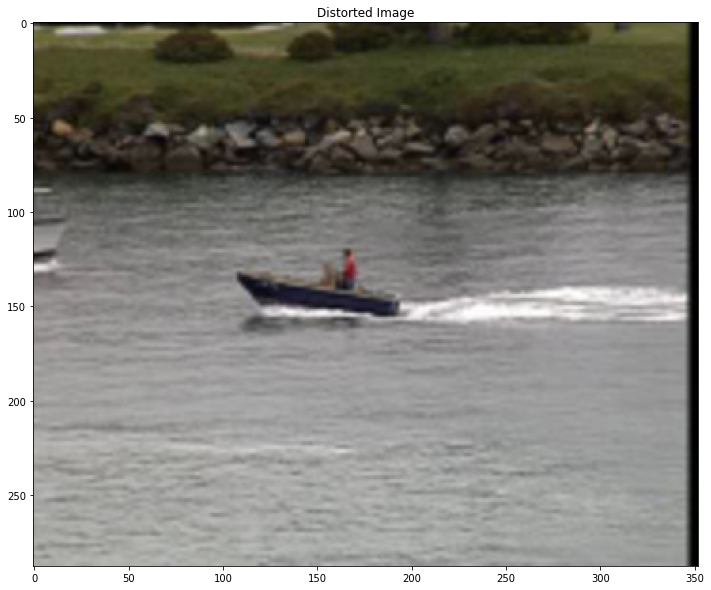

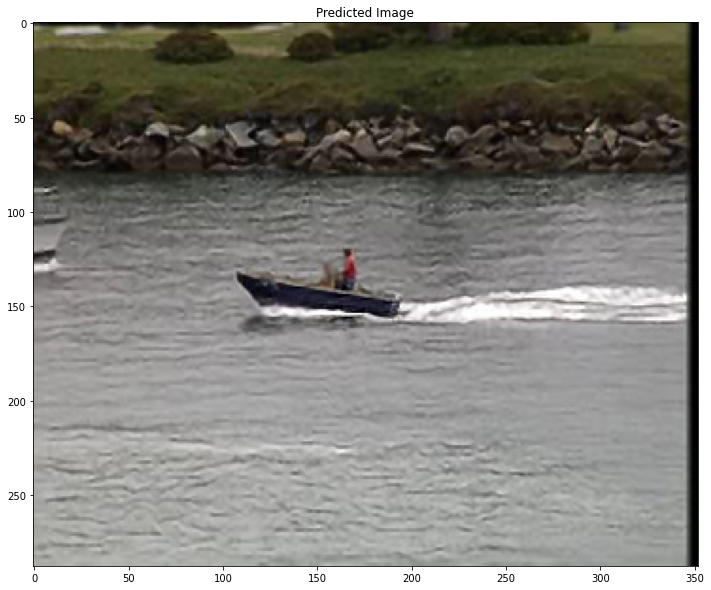

In [ ]:
image_path='/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Test/Set14/coastguard.bmp'

fig, ax = plt.subplots(figsize=(15, 10))
ax.imshow(Image.open(image_path))
ax.title.set_text("Original Image")
plt.show()

target = cv2.imread(image_path, cv2.IMREAD_COLOR)
target = cv2.cvtColor(target, cv2.COLOR_BGR2YCrCb)
shape = target.shape

# Resize down by scale of 2
Y_img = cv2.resize(target[:, :, 0], (int(shape[1] / 2), int(shape[0] / 2)))

# Resize up to orignal image
Y_img = cv2.resize(Y_img, (shape[1], shape[0]))
target[:, :, 0] = Y_img
target = cv2.cvtColor(target, cv2.COLOR_YCrCb2BGR)
cv2.imwrite('/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Output/test1.jpg', target)

fig, ax = plt.subplots(figsize=(15, 10))
ax.imshow(Image.open('/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Output/test1.jpg'))
ax.title.set_text("Distorted Image")
plt.show()

Y = np.zeros((1, target.shape[0], target.shape[1], 1), dtype=np.float32)
# Normalize
Y[0, :, :, 0] = Y_img.astype(np.float32) / 255.

# Predict
pre = model.predict(Y, batch_size=1) * 255.

# Post process output
pre[pre[:] > 255] = 255
pre[pre[:] < 0] = 0
pre = pre.astype(np.uint8)

# Copy y channel back to image and convert to BGR
output = cv2.cvtColor(target, cv2.COLOR_BGR2YCrCb)
output[6: -6, 6: -6, 0] = pre[0, :, :, 0]
output = cv2.cvtColor(output, cv2.COLOR_YCrCb2BGR)

# Save image
cv2.imwrite('/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Output/test3.jpg', output)

fig, ax = plt.subplots(figsize=(15, 10))
ax.imshow(Image.open('/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Output/test3.jpg'))
ax.title.set_text("Predicted Image")
plt.show()


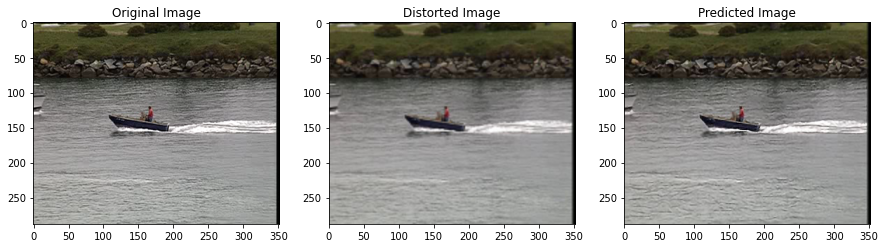

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(15, 10))
ax[0].imshow(Image.open(image_path))
ax[0].title.set_text("Original Image")

ax[1].imshow(Image.open('/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Output/test1.jpg'))
ax[1].title.set_text("Distorted Image")

ax[2].imshow(Image.open('/content/gdrive/MyDrive/Final_Project_Super Resolution/Dataset/Output/test3.jpg'))
ax[2].title.set_text("Predicted Image")